In [99]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy
sns.set()
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
%matplotlib inline
import pickle

%pylab inline
%config InlineBackend.figure_formats = ['retina']

import pandas as pd
import seaborn as sns
sns.set()

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

Populating the interactive namespace from numpy and matplotlib


In [137]:
EA_df = pickle.load( open('EA_df.pkl', "rb" ) )
type_df = pickle.load( open('type_df.pkl', "rb" ) )

In [101]:
EA_df

,Age,R,HR,RBI,SB,SO,BA,OBP,SLG,OPS,GDP,IBB,2,3,4,5,6,7,8,9
1,30.0,41.0,8.0,41.0,3.0,69.0,0.273,0.310,0.430,0.740,4.0,0.0,0,0,0,0,0,0,1,0
2,25.0,118.0,20.0,93.0,27.0,113.0,0.335,0.446,0.549,0.995,13.0,8.0,0,0,0,0,0,1,0,0
5,27.0,42.0,14.0,42.0,6.0,60.0,0.286,0.363,0.525,0.888,8.0,4.0,0,1,0,0,0,0,0,0
8,28.0,17.0,0.0,15.0,4.0,38.0,0.271,0.309,0.356,0.664,1.0,0.0,0,0,0,0,1,0,0,0
10,25.0,123.0,27.0,108.0,9.0,85.0,0.304,0.385,0.502,0.886,14.0,2.0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
816,28.0,61.0,11.0,59.0,24.0,83.0,0.285,0.361,0.423,0.784,2.0,5.0,0,0,1,0,0,0,0,0
822,28.0,64.0,21.0,55.0,2.0,107.0,0.272,0.334,0.518,0.852,4.0,1.0,0,0,0,0,0,1,0,0
824,27.0,100.0,44.0,97.0,30.0,118.0,0.329,0.429,0.671,1.100,8.0,16.0,0,0,0,0,0,0,0,1
829,34.0,20.0,6.0,27.0,0.0,39.0,0.257,0.321,0.415,0.736,4.0,0.0,0,1,0,0,0,0,0,0


In [102]:


EA_df['HR']= pd.to_numeric(EA_df['HR'])
EA_df['RBI']= pd.to_numeric(EA_df['RBI'])
EA_df['SB']= pd.to_numeric(EA_df['SB'])


EA_df['SO']= pd.to_numeric(EA_df['SO'])

EA_df['OBP']= pd.to_numeric(EA_df['OBP'])
EA_df['SLG']= pd.to_numeric(EA_df['SLG'])


EA_df['GDP']= pd.to_numeric(EA_df['GDP'])



EA_df['IBB']= pd.to_numeric(EA_df['IBB'])

In [80]:
# EA_df.dtypes

In [98]:
EA_df.describe()

,Age,R,HR,RBI,SB,SO,BA,OBP,SLG,OPS,...,3,4,5,6,7,8,9,BA_log,OPS_log,R_log
count,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,...,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000,6184.000000
mean,28.882924,35.008571,8.176585,33.380336,4.502102,54.236417,0.240160,0.304594,0.374479,0.679059,...,0.108506,0.146184,0.118047,0.100906,0.172704,0.109961,0.090395,-1.466580,-0.434322,-inf
std,4.222680,30.106116,9.545868,29.871165,8.012464,38.292393,0.056665,0.068210,0.114525,0.175941,...,0.311043,0.353319,0.322689,0.301228,0.378022,0.312867,0.286769,0.319076,0.344180,NaN
min,19.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.016000,0.019000,0.016000,0.038000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4.135167,-3.270169,-inf
25%,26.000000,10.000000,1.000000,9.000000,0.000000,23.000000,0.214000,0.279000,0.315000,0.603000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.541779,-0.505838,2.302585
50%,28.000000,26.000000,4.000000,24.000000,1.000000,43.000000,0.251000,0.317000,0.385000,0.705000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.382302,-0.349557,3.258097
75%,32.000000,55.000000,12.000000,51.000000,5.000000,77.000000,0.278000,0.348000,0.449000,0.789000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.280134,-0.236989,4.007333
max,48.000000,152.000000,73.000000,160.000000,78.000000,223.000000,0.397000,0.609000,0.863000,1.422000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-0.923819,0.352064,5.023881


In [136]:
# EA_df['BA_log']=np.log(EA_df['BA'])

# EA_df['OPS_log']=np.log(EA_df['OPS'])
# EA_df['R_log']=np.log(EA_df['R'])


KeyError: '2'

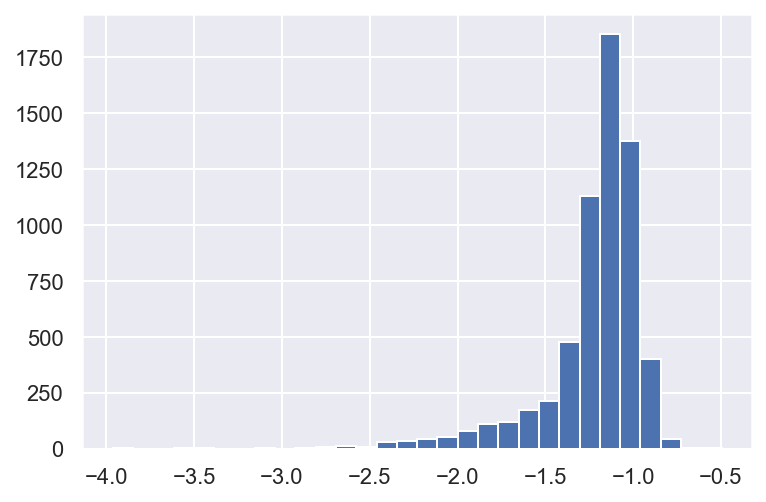

In [103]:
fig = np.log(EA_df['OBP']).hist(bins=30)

In [85]:
# y=EA_df['OBP']
# x1=EA_df.drop(['OBP'],axis=1)
# x=sm.add_constant(x1)
# results=sm.OLS(y,x).fit()
# results.summary()


In [87]:
EA_df_subset1 = EA_df.drop(['R','BA','OPS'],axis=1)

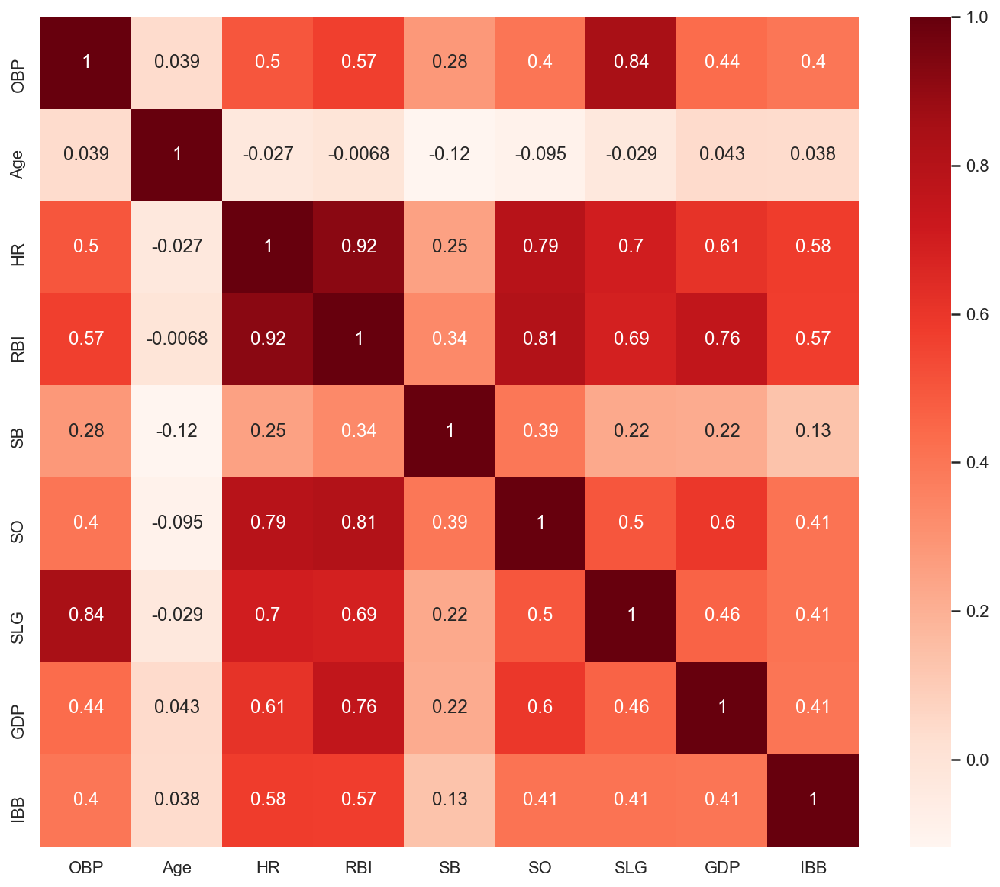

<Figure size 432x288 with 0 Axes>

In [106]:
plt.figure(figsize=(12,10))
EA_df_subset2= EA_df_subset1.loc[:,['OBP','Age','HR', 'RBI','SB','SO', 'SLG', 'GDP', 'IBB']]
corr = EA_df_subset2.corr()
sns.heatmap(corr, annot=True, cmap=plt.cm.Reds)
plt.show()
plt.savefig('Heatmap_features.png', dpi=400)

In [108]:
sns.pairplot(EA_df, plot_kws=dict(alpha=.1, edgecolor='none'))
plt.savefig("Target_Value_Relationships.png")

In [109]:
y=EA_df['OBP']
X=EA_df.drop(['OBP'],axis=1)
X.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 6184 entries, 1 to 830
Data columns (total 19 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Age     6184 non-null   float64
 1   R       6184 non-null   float64
 2   HR      6184 non-null   float64
 3   RBI     6184 non-null   float64
 4   SB      6184 non-null   float64
 5   SO      6184 non-null   float64
 6   BA      6184 non-null   float64
 7   SLG     6184 non-null   float64
 8   OPS     6184 non-null   float64
 9   GDP     6184 non-null   float64
 10  IBB     6184 non-null   float64
 11  2       6184 non-null   uint8  
 12  3       6184 non-null   uint8  
 13  4       6184 non-null   uint8  
 14  5       6184 non-null   uint8  
 15  6       6184 non-null   uint8  
 16  7       6184 non-null   uint8  
 17  8       6184 non-null   uint8  
 18  9       6184 non-null   uint8  
dtypes: float64(11), uint8(8)
memory usage: 788.1 KB


In [110]:
def split_and_validate(X, y):
    '''
    For a set of features and target X, y, perform a 80/20 train/val split, 
    fit and validate a linear regression model, and report results
    '''
    
    # perform train/val split
    X_train, X_val, y_train, y_val = \
        train_test_split(X, y, test_size=0.2, random_state=42)
    
    # fit linear regression to training data
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)
    
    # score fit model on validation data
    val_score = lr_model.score(X_val, y_val)
    
    # report results
    print('\nValidation R^2 score was:', val_score)
    print('Feature coefficient results: \n')
    for feature, coef in zip(X.columns, lr_model.coef_):
        print(feature, ':', f'{coef:.2f}') 

In [111]:
split_and_validate(X, y)


Validation R^2 score was: 0.999954225422754
Feature coefficient results: 

Age : 0.00
R : -0.00
HR : -0.00
RBI : 0.00
SB : 0.00
SO : -0.00
BA : 0.00
SLG : -1.00
OPS : 1.00
GDP : 0.00
IBB : 0.00
2 : 0.00
3 : -0.00
4 : 0.00
5 : -0.00
6 : -0.00
7 : -0.00
8 : 0.00
9 : 0.00


In [117]:
# X.drop(['BA'], axis=1, inplace=True)
# X.drop(['OPS'], axis=1, inplace=True)
X['SLG_log']=np.log(EA_df['SLG'])
X1 = X
X1.drop(['SLG'], axis=1, inplace=True)

In [118]:
def split_and_validate(X1, y):
    '''
    For a set of features and target X, y, perform a 80/20 train/val split, 
    fit and validate a linear regression model, and report results
    '''
    
    # perform train/val split
    X_train, X_val, y_train, y_val = \
        train_test_split(X1, y, test_size=0.2, random_state=42)
    
    # fit linear regression to training data
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)
    
    # score fit model on validation data
    val_score = lr_model.score(X_val, y_val)
    
    # report results
    print('\nValidation R^2 score was:', val_score)
    print('Feature coefficient results: \n')
    for feature, coef in zip(X.columns, lr_model.coef_):
        print(feature, ':', f'{coef:.2f}') 

In [119]:
split_and_validate(X1, y)


Validation R^2 score was: 0.7976710995767908
Feature coefficient results: 

Age : 0.00
R : 0.00
HR : -0.00
RBI : 0.00
SB : -0.00
SO : -0.00
GDP : -0.00
IBB : 0.00
2 : 0.00
3 : 0.00
4 : -0.00
5 : 0.00
6 : 0.00
7 : -0.00
8 : -0.00
9 : -0.00
SLG_log : 0.13


In [127]:
narrow_df = EA_df
narrow_df.drop(['BA'], axis=1, inplace=True)
narrow_df.drop(['RBI'], axis=1, inplace=True)
narrow_df.drop(['SO'], axis=1, inplace=True)
narrow_df.drop(['SLG'], axis=1, inplace=True)
narrow_df.drop(['OPS'], axis=1, inplace=True)
narrow_df.drop(['GDP'], axis=1, inplace=True)
narrow_df.drop(['IBB'], axis=1, inplace=True)
narrow_df

,Age,R,HR,SB,OBP,2,3,4,5,6,7,8,9
1,30.0,41.0,8.0,3.0,0.310,0,0,0,0,0,0,1,0
2,25.0,118.0,20.0,27.0,0.446,0,0,0,0,0,1,0,0
5,27.0,42.0,14.0,6.0,0.363,0,1,0,0,0,0,0,0
8,28.0,17.0,0.0,4.0,0.309,0,0,0,0,1,0,0,0
10,25.0,123.0,27.0,9.0,0.385,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
816,28.0,61.0,11.0,24.0,0.361,0,0,1,0,0,0,0,0
822,28.0,64.0,21.0,2.0,0.334,0,0,0,0,0,1,0,0
824,27.0,100.0,44.0,30.0,0.429,0,0,0,0,0,0,0,1
829,34.0,20.0,6.0,0.0,0.321,0,1,0,0,0,0,0,0


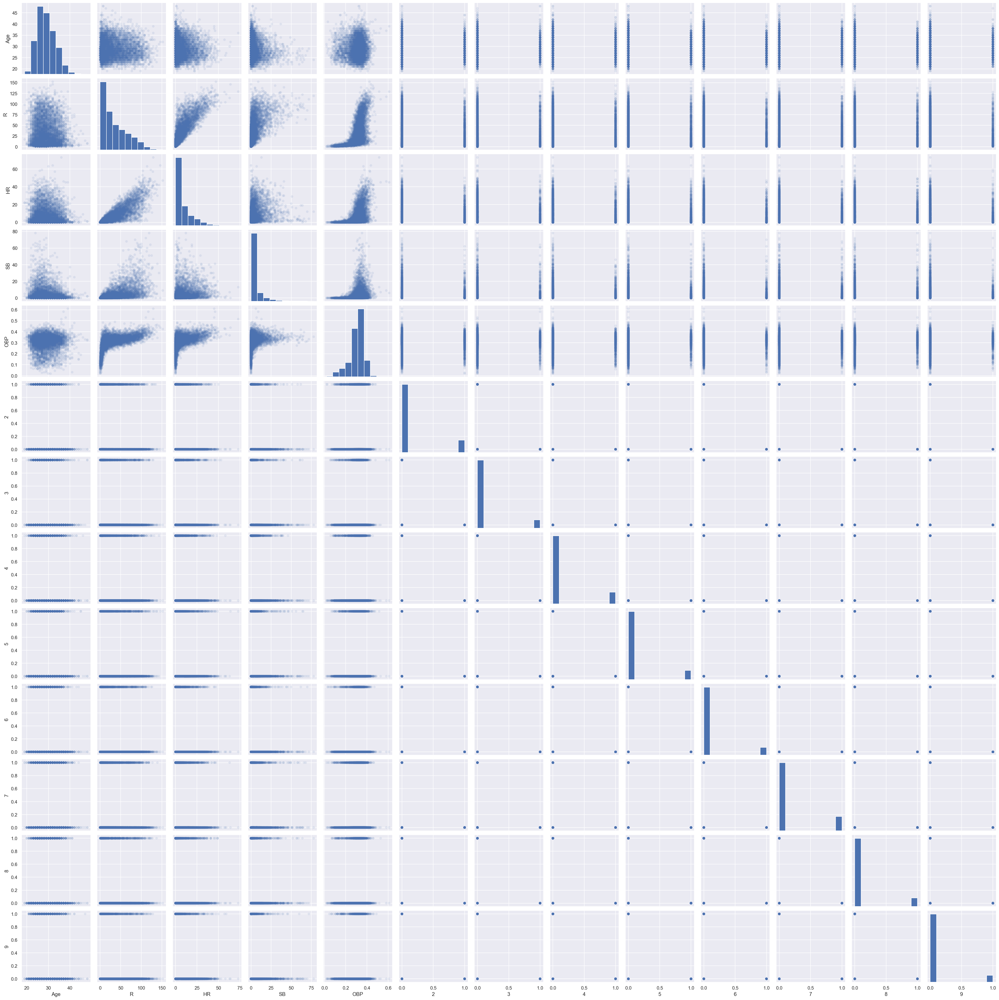

In [128]:
sns.pairplot(narrow_df, plot_kws=dict(alpha=.1, edgecolor='none'))
plt.savefig("Target_Value_Relationships.png")

In [129]:
X2 = X1.copy()

X2['SB2'] = X2['SB'] ** 2
X2['HR2'] = X2['HR'] ** 2
X2['R2'] = X2['R'] ** 2

split_and_validate(X2, y)


Validation R^2 score was: 0.8035098391010931
Feature coefficient results: 

Age : 0.00
R : 0.00
HR : -0.00
RBI : 0.00
SB : -0.00
SO : -0.00
GDP : -0.00
IBB : 0.00
2 : 0.00
3 : 0.00
4 : -0.00
5 : 0.00
6 : 0.00
7 : -0.00
8 : -0.00
9 : -0.00
SLG_log : 0.13


In [131]:
X3 = X2.copy()

# multiplicative interaction
X3['R_x_HR'] = X3['R'] * X3['HR']

X3['SB_x_R'] = X3['SB'] * X3['R']

split_and_validate(X3, y)


Validation R^2 score was: 0.8082809646125362
Feature coefficient results: 

Age : 0.00
R : 0.00
HR : -0.01
RBI : -0.00
SB : -0.00
SO : -0.00
GDP : -0.00
IBB : 0.00
2 : 0.00
3 : 0.00
4 : -0.00
5 : 0.00
6 : 0.00
7 : -0.00
8 : -0.00
9 : -0.00
SLG_log : 0.13


In [146]:
type_df



# type_df.drop(['R'], axis=1, inplace=True)
# type_df.drop(['CS'], axis=1, inplace=True)
# type_df.drop(['TB'], axis=1, inplace=True)
# type_df.drop(['HBP'], axis=1, inplace=True)
# type_df.drop(['SH'], axis=1, inplace=True)
# type_df.drop(['SF'], axis=1, inplace=True)
# type_df.drop(['PA'], axis=1, inplace=True)
# type_df.drop(['BA'], axis=1, inplace=True)
type_df.drop(['OBP'], axis=1, inplace=True)


In [147]:


split_and_validate(type_df, y)


Validation R^2 score was: 0.7826749428043348
Feature coefficient results: 

Age : 0.00
R : -0.00
HR : 0.00
RBI : 0.00
SB : 0.00
SO : 0.56
GDP : 0.00
IBB : 0.00


In [149]:

x=sm.add_constant(X3)
results=sm.OLS(y,x).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    OBP   R-squared:                       0.810
Model:                            OLS   Adj. R-squared:                  0.809
Method:                 Least Squares   F-statistic:                     1247.
Date:                Fri, 22 Jan 2021   Prob (F-statistic):               0.00
Time:                        04:54:51   Log-Likelihood:                 12958.
No. Observations:                6184   AIC:                        -2.587e+04
Df Residuals:                    6162   BIC:                        -2.572e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3581      0.003    122.508      0.000       0.352       0.364
Age            0.0008   9.19e-05      8.339      0.000       0.001       0.001
R              0.0023   9.96e-05     22.727      0.000       0.002       0.002
HR            -0.0053      0.000    -21.989      0.000      -0.006      -0.005
RBI         4.004e-06   5.26e-05      0.076      0.939   -9.92e-05       0.000
SB            -0.0006      0.000     -2.928      0.003      -0.001      -0.000
SO            -0.0002   2.07e-05     -8.991      0.000      -0.000      -0.000
GDP           -0.0006      0.000     -5.044      0.000      -0.001      -0.000
IBB            0.0020      0.000     15.919      0.000       0.002       0.002
2              0.0460      0.001     46.505      0.000       0.044       0.048
3              0.0464      0.001     41.036      0.000       0.044       0.049
4              0.0423      0.001     41.927      0.000       0.040       0.044
5              0.0459      0.001     41.822      0.000       0.044       0.048
6              0.0447      0.001     38.482      0.000       0.042       0.047
7              0.0443      0.001     46.724      0.000       0.042       0.046
8              0.0434      0.001     38.300      0.000       0.041       0.046
9              0.0451      0.001     36.838      0.000       0.043       0.048
SLG_log        0.1300      0.001     98.475      0.000       0.127       0.133
SB2         5.775e-06   3.37e-06      1.713      0.087   -8.34e-07    1.24e-05
HR2        -1.629e-05   6.93e-06     -2.350      0.019   -2.99e-05    -2.7e-06
R2         -1.658e-05    1.2e-06    -13.757      0.000   -1.89e-05   -1.42e-05
R_x_HR      5.524e-05   4.91e-06     11.247      0.000    4.56e-05    6.49e-05
SB_x_R      1.538e-06   2.82e-06      0.545      0.586      -4e-06    7.07e-06
==============================================================================
Omnibus:                      361.819   Durbin-Watson:                   1.938
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              895.228
Skew:                           0.346   Prob(JB):                    4.01e-195
Kurtosis:                       4.731   Cond. No.                     3.89e+19
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.33e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [150]:
X3.drop(['SLG_log'], axis=1, inplace=True)

In [151]:
x=sm.add_constant(X3)
results=sm.OLS(y,x).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    OBP   R-squared:                       0.510
Model:                            OLS   Adj. R-squared:                  0.508
Method:                 Least Squares   F-statistic:                     320.4
Date:                Fri, 22 Jan 2021   Prob (F-statistic):               0.00
Time:                        04:58:47   Log-Likelihood:                 10035.
No. Observations:                6184   AIC:                        -2.003e+04
Df Residuals:                    6163   BIC:                        -1.989e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2062      0.004     51.762      0.000       0.198       0.214
Age            0.0003      0.000      2.051      0.040    1.34e-05       0.001
R              0.0049      0.000     32.062      0.000       0.005       0.005
HR             0.0001      0.000      0.382      0.702      -0.001       0.001
RBI            0.0001   8.44e-05      1.189      0.234   -6.51e-05       0.000
SB            -0.0010      0.000     -3.319      0.001      -0.002      -0.000
SO            -0.0008   3.15e-05    -25.994      0.000      -0.001      -0.001
GDP           -0.0018      0.000     -9.436      0.000      -0.002      -0.001
IBB            0.0023      0.000     11.727      0.000       0.002       0.003
2              0.0268      0.002     17.229      0.000       0.024       0.030
3              0.0281      0.002     15.685      0.000       0.025       0.032
4              0.0224      0.002     14.154      0.000       0.019       0.026
5              0.0279      0.002     16.040      0.000       0.024       0.031
6              0.0259      0.002     14.116      0.000       0.022       0.030
7              0.0266      0.001     17.827      0.000       0.024       0.030
8              0.0226      0.002     12.653      0.000       0.019       0.026
9              0.0258      0.002     13.316      0.000       0.022       0.030
SB2         1.703e-06   5.41e-06      0.315      0.753    -8.9e-06    1.23e-05
HR2        -4.628e-05   1.11e-05     -4.165      0.000   -6.81e-05   -2.45e-05
R2         -3.555e-05   1.91e-06    -18.635      0.000   -3.93e-05   -3.18e-05
R_x_HR      4.049e-05   7.88e-06      5.141      0.000     2.5e-05    5.59e-05
SB_x_R      1.084e-05   4.53e-06      2.395      0.017    1.97e-06    1.97e-05
==============================================================================
Omnibus:                      203.399   Durbin-Watson:                   1.915
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              394.481
Skew:                          -0.242   Prob(JB):                     2.18e-86
Kurtosis:                       4.139   Cond. No.                     3.82e+19
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.57e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [153]:

from sklearn import model_selection
from sklearn.linear_model import LinearRegression ,Ridge, RidgeCV
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

In [154]:


reg = LassoCV()
reg.fit(X3, y)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(X3,y))
coef = pd.Series(reg.coef_, index = X3.columns)

Best alpha using built-in LassoCV: 0.103863
Best score using built-in LassoCV: 0.415175


In [155]:
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")


Lasso picked 6 variables and eliminated the other 15 variables


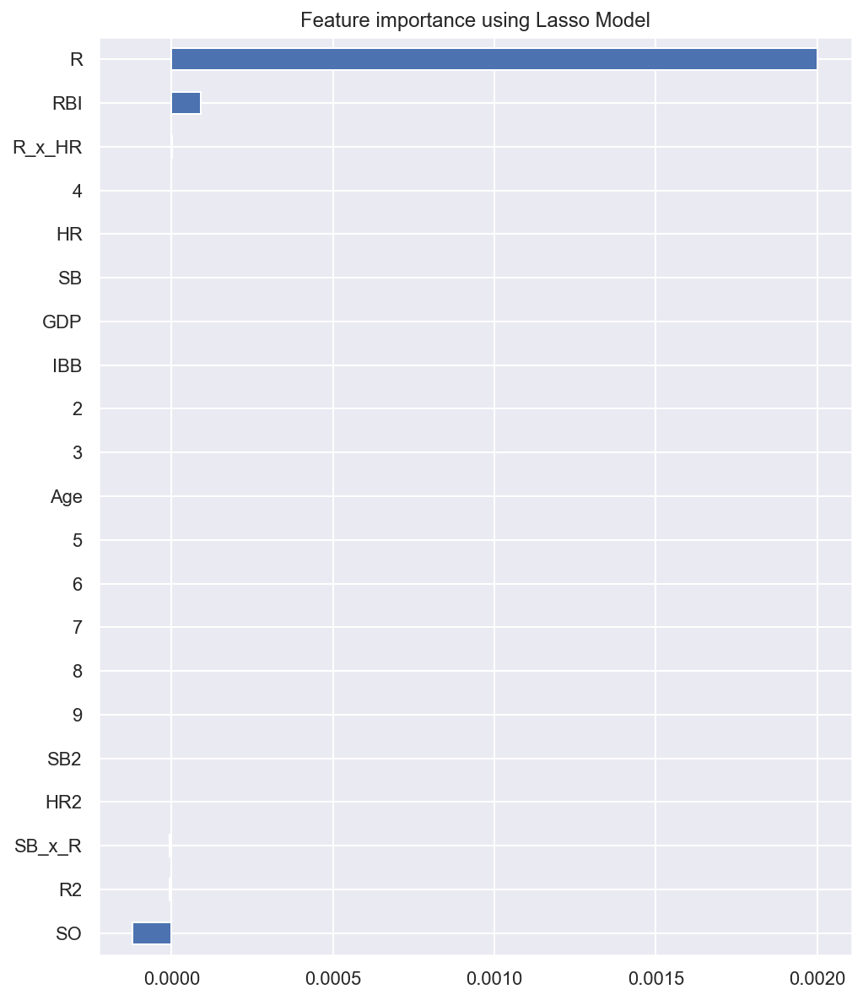

In [157]:
imp_coef = coef.sort_values()
import matplotlib
matplotlib.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title("Feature importance using Lasso Model")
plt.savefig("Feature Importance Lasso.png")

In [158]:
reg = RidgeCV()
reg.fit(X3, y)
print("Best alpha using built-in RidgeCV: %f" % reg.alpha_)
print("Best score using built-in RidgeCV: %f" %reg.score(X3,y))
coef = pd.Series(reg.coef_, index = X3.columns)

Best alpha using built-in RidgeCV: 10.000000
Best score using built-in RidgeCV: 0.509782


In [159]:
print("Ridge picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Ridge picked 21 variables and eliminated the other 0 variables


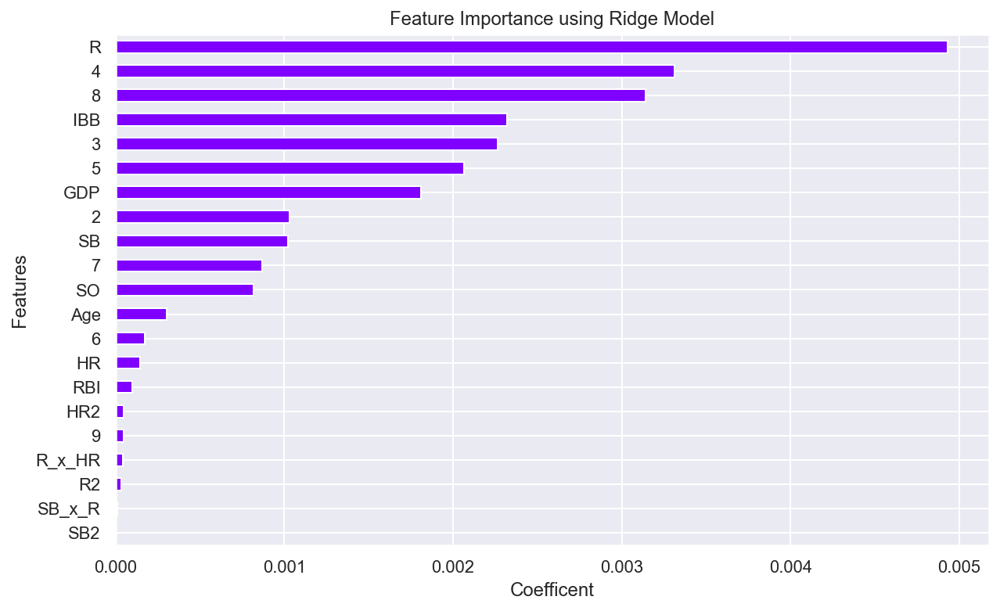

In [163]:
imp_coef = abs(coef).sort_values()
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10.0, 6.0)
imp_coef.plot(kind = "barh",cmap='rainbow')
plt.title("Feature Importance using Ridge Model")
plt.xlabel("Coefficent")
plt.ylabel("Features")
plt.savefig("Feature Importance Ridge.png")

In [162]:
with open('X3.pkl', 'wb') as picklefile:
    pickle.dump(X3, picklefile)
with open('y.pkl', 'wb') as picklefile:
    pickle.dump(y, picklefile)
